<a href="https://colab.research.google.com/github/yushendye/AerialInspection/blob/main/detectron_fresh_train_19_aug.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 23 kB/s 
     |████████████████████████████████| 6.6 MB 40.4 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu102
    Uninstalling torch-1.9.0+cu102:
      Successfully uninstalled torch-1.9.0+cu102
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.10.0+cu102
    Uninstalling torchvision-0.10.0+cu102:
      Successfully uninstalled torchvision-0.10.0+cu102
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.10.0 requires torch==1.9.0, but you have torch 1.5.0+cu101 which is incompatible.
     |████████████████████████████████| 274 kB 11.9 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=64f05e4c6e90ce2118117f1f0a902

In [3]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2 MB 747 kB/s 
     |████████████████████████████████| 49 kB 5.8 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20210812-py3-none-any.whl size=60666 sha256=e3b3af8de3b10cd9c790303b1a30b6217c5a4a5589300e885829140353bde4d2
  Stored in directory: /root/.cache/pip/wheels/96/b3/60/5dd98f4458841d2c07395a99e2d7f4260b5a320e4aebb683d1
Successfully built fvcore


In [4]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

In [8]:
#getting training data
%cd /content/
!gdown --id 1Hh7XFuyPV2qH5Pg6sqce6WmdOZoSh-th
!gdown --id 1FeJJYBgcfuZsunkk-WQFkHO8ry-Ywhrn

!unzip /content/Dataset.zip

/content
Downloading...
From: https://drive.google.com/uc?id=1FeJJYBgcfuZsunkk-WQFkHO8ry-Ywhrn
To: /content/Dataset.zip
114MB [00:00, 185MB/s] 
Archive:  /content/Dataset.zip
replace Dataset/000000010363.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [6]:
%cd /content/
!rm -rf /content/test_images/

!gdown --id 1WJxlhhb-fYf6YxXPkuWbxeuFF1kyn4QR

!gdown --id 1pay0cn54PgEniz3Sctv01aKoSODmL_36
!unzip /content/test_data.zip

/content
Downloading...
From: https://drive.google.com/uc?id=1WJxlhhb-fYf6YxXPkuWbxeuFF1kyn4QR
To: /content/main.json
100% 386k/386k [00:00<00:00, 43.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1pay0cn54PgEniz3Sctv01aKoSODmL_36
To: /content/test_data.zip
36.4MB [00:00, 59.2MB/s]
Archive:  /content/test_data.zip
   creating: test_data/
  inflating: test_data/COCO_val2014_000000451623.jpg  
  inflating: test_data/COCO_val2014_000000500826.jpg  
  inflating: test_data/COCO_val2014_000000255036.jpg  
  inflating: test_data/COCO_val2014_000000377832.jpg  
  inflating: test_data/COCO_val2014_000000279596.jpg  
  inflating: test_data/COCO_val2014_000000009274.jpg  
  inflating: test_data/COCO_val2014_000000082921.jpg  
  inflating: test_data/COCO_val2014_000000549943.jpg  
  inflating: test_data/COCO_val2014_000000287725.jpg  
  inflating: test_data/COCO_val2014_000000410712.jpg  
  inflating: test_data/COCO_val2014_000000230450.jpg  
  inflating: test_data/COCO_val2014_0000003

In [9]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train.json", "/content/Dataset")
register_coco_instances("my_dataset_val", {}, "/content/test.json", "/content/test_data")
register_coco_instances("my_dataset_test", {}, "/content/test.json", "/content/test_data")

[08/19 09:14:11 d2.data.datasets.coco]: Loaded 689 images in COCO format from /content/train.json


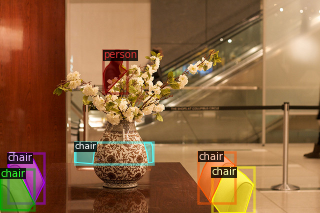

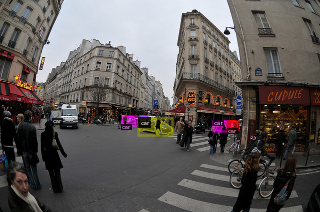

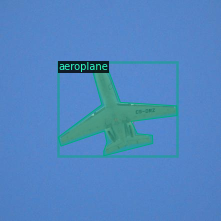

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train3")
dataset_dicts = DatasetCatalog.get("my_dataset_train3")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

[08/19 09:14:20 d2.data.datasets.coco]: Loaded 190 images in COCO format from /content/test.json


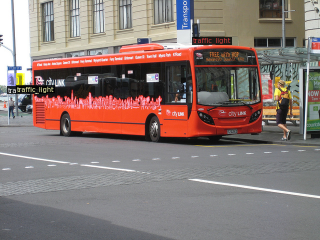

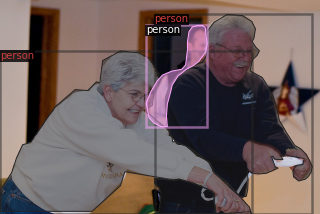

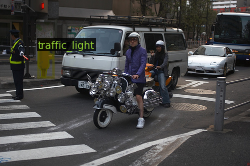

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_val3")
dataset_dicts = DatasetCatalog.get("my_dataset_val3")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [11]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [12]:
!nvidia-smi

Thu Aug 19 11:04:34 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.57.02    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P8    27W / 149W |      3MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [33]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.OUTPUT_DIR = "/content/drive/MyDrive/19_Aug_Detectron/"
cfg.SOLVER.CHECKPOINT_PERIOD = 500
cfg.merge_from_file(model_zoo.get_config_file("Misc/cascade_mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("Misc/cascade_mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 15000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=True)
trainer.train()

[08/19 11:52:02 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [17]:
import os
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_0013499.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[08/19 11:29:24 d2.data.datasets.coco]: Loaded 190 images in COCO format from /content/test.json
[08/19 11:29:24 d2.data.common]: Serializing 190 elements to byte tensors and concatenating them all ...
[08/19 11:29:24 d2.data.common]: Serialized dataset takes 0.34 MiB
[08/19 11:29:24 d2.evaluation.evaluator]: Start inference on 190 images
[08/19 11:29:31 d2.evaluation.evaluator]: Inference done 11/190. 0.4351 s / img. ETA=0:01:34
[08/19 11:29:36 d2.evaluation.evaluator]: Inference done 21/190. 0.4397 s / img. ETA=0:01:28
[08/19 11:29:41 d2.evaluation.evaluator]: Inference done 31/190. 0.4493 s / img. ETA=0:01:24
[08/19 11:29:47 d2.evaluation.evaluator]: Inference done 41/190. 0.4513 s / img. ETA=0:01:19
[08/19 11:29:52 d2.evaluation.evaluator]: Inference done 51/190. 0.4505 s / img. ETA=0:01:13
[08/19 11:29:57 d2.evaluation.evaluator]: Inference done 61/190. 0.4516 s / img. ETA=0:01:08
[08/19 11:30:03 d2.evaluation.evaluator]: Inference done 71/190. 0.4527 s / img. ETA=0:01:03
[08/19 1

OrderedDict([('bbox',
              {'AP': 0.4314695480745291,
               'AP-aeroplane': 1.7469192489715277,
               'AP-car': 0.4922860713640925,
               'AP-chair': 0.0,
               'AP-cow': 0.0,
               'AP-person': 0.04963951566562888,
               'AP-traffic_light': 0.2999724524459255,
               'AP50': 0.8496010099082922,
               'AP75': 0.37392874967894707,
               'APl': 1.3275058614068218,
               'APm': 1.2206898258507197,
               'APs': 0.15343595624196685}),
             ('segm',
              {'AP': 0.1697501462867052,
               'AP-aeroplane': 0.44476989314909,
               'AP-car': 0.36113114688090436,
               'AP-chair': 0.0,
               'AP-cow': 0.0,
               'AP-person': 0.0,
               'AP-traffic_light': 0.21259983769023688,
               'AP50': 0.501525140669521,
               'AP75': 0.07747095128678584,
               'APl': 0.5041448394567873,
               'APm': 

In [34]:
import os
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_train", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_train")zz
inference_on_dataset(trainer.model, val_loader, evaluator)

[08/19 12:29:42 d2.data.datasets.coco]: Loaded 689 images in COCO format from /content/train.json
[08/19 12:29:42 d2.data.common]: Serializing 689 elements to byte tensors and concatenating them all ...
[08/19 12:29:42 d2.data.common]: Serialized dataset takes 1.33 MiB
[08/19 12:29:42 d2.evaluation.evaluator]: Start inference on 689 images
[08/19 12:29:47 d2.evaluation.evaluator]: Inference done 11/689. 0.4308 s / img. ETA=0:04:57
[08/19 12:29:52 d2.evaluation.evaluator]: Inference done 23/689. 0.4153 s / img. ETA=0:04:43
[08/19 12:29:58 d2.evaluation.evaluator]: Inference done 36/689. 0.4114 s / img. ETA=0:04:35
[08/19 12:30:03 d2.evaluation.evaluator]: Inference done 48/689. 0.4099 s / img. ETA=0:04:29
[08/19 12:30:08 d2.evaluation.evaluator]: Inference done 60/689. 0.4129 s / img. ETA=0:04:27
[08/19 12:30:13 d2.evaluation.evaluator]: Inference done 72/689. 0.4141 s / img. ETA=0:04:23
[08/19 12:30:19 d2.evaluation.evaluator]: Inference done 84/689. 0.4155 s / img. ETA=0:04:19
[08/19 

OrderedDict([('bbox',
              {'AP': 81.40561229873987,
               'AP-aeroplane': 96.54295986308263,
               'AP-car': 77.63010610582522,
               'AP-chair': 81.81220522673237,
               'AP-cow': 86.05535922210463,
               'AP-person': 81.1457293951596,
               'AP-traffic_light': 65.24731397953475,
               'AP50': 94.59419423401496,
               'AP75': 87.40269513134731,
               'APl': 96.72973243377395,
               'APm': 90.05238266526312,
               'APs': 72.10358577919023}),
             ('segm',
              {'AP': 59.325734250826315,
               'AP-aeroplane': 62.52341722948606,
               'AP-car': 61.88385163787282,
               'AP-chair': 55.74338249576098,
               'AP-cow': 63.444879375200124,
               'AP-person': 57.343696125528865,
               'AP-traffic_light': 55.01517864110905,
               'AP50': 91.63262949623851,
               'AP75': 68.73576101077556,
           

In [18]:
!wget https://thumbs.dreamstime.com/z/group-young-people-crossing-road-outdoors-town-talking-coronavirus-concept-portrait-200047621.jpg

--2021-08-19 11:39:34--  https://thumbs.dreamstime.com/z/group-young-people-crossing-road-outdoors-town-talking-coronavirus-concept-portrait-200047621.jpg
Resolving thumbs.dreamstime.com (thumbs.dreamstime.com)... 192.229.233.122
Connecting to thumbs.dreamstime.com (thumbs.dreamstime.com)|192.229.233.122|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 297652 (291K) [image/jpeg]
Saving to: ‘group-young-people-crossing-road-outdoors-town-talking-coronavirus-concept-portrait-200047621.jpg’

group-young-people- 100%[===================>] 290.68K  --.-KB/s    in 0.02s   

2021-08-19 11:39:34 (15.8 MB/s) - ‘group-young-people-crossing-road-outdoors-town-talking-coronavirus-concept-portrait-200047621.jpg’ saved [297652/297652]



In [35]:
import cv2
im = cv2.imread('/content/group-young-people-crossing-road-outdoors-town-talking-coronavirus-concept-portrait-200047621.jpg')

predictor = DefaultPredictor(cfg)
outputs = predictor(im)

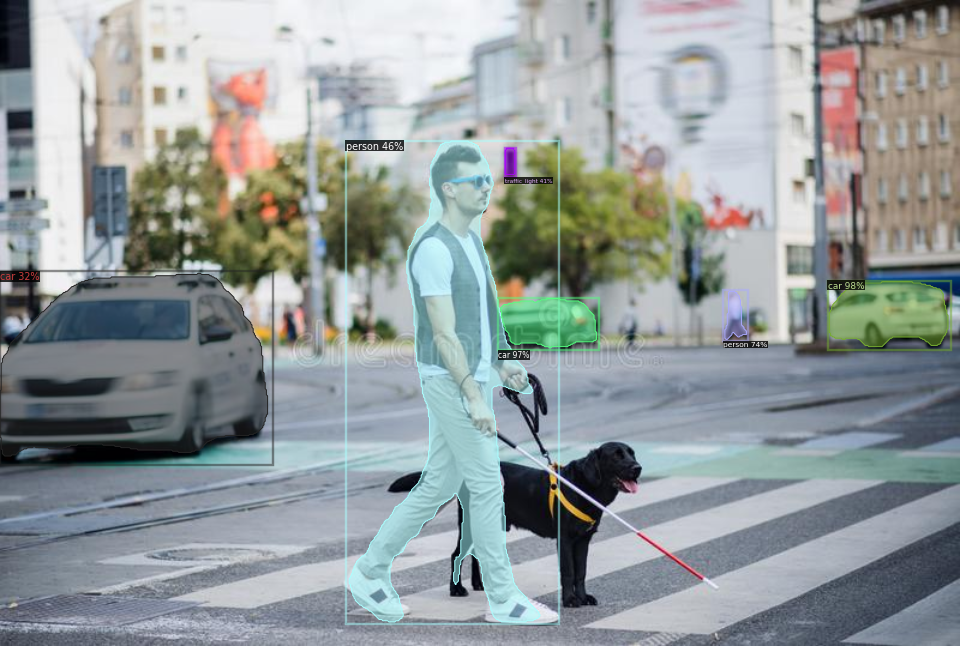

In [40]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [24]:
!wget https://media.wired.com/photos/593257829be5e55af6c24476/master/w_2560%2Cc_limit/trafficlight-inline.jpg

--2021-08-19 11:48:15--  https://media.wired.com/photos/593257829be5e55af6c24476/master/w_2560%2Cc_limit/trafficlight-inline.jpg
Resolving media.wired.com (media.wired.com)... 151.101.0.239, 151.101.64.239, 151.101.128.239, ...
Connecting to media.wired.com (media.wired.com)|151.101.0.239|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 65217 (64K) [image/jpeg]
Saving to: ‘trafficlight-inline.jpg’

trafficlight-inline 100%[===================>]  63.69K  --.-KB/s    in 0.004s  

2021-08-19 11:48:15 (14.9 MB/s) - ‘trafficlight-inline.jpg’ saved [65217/65217]



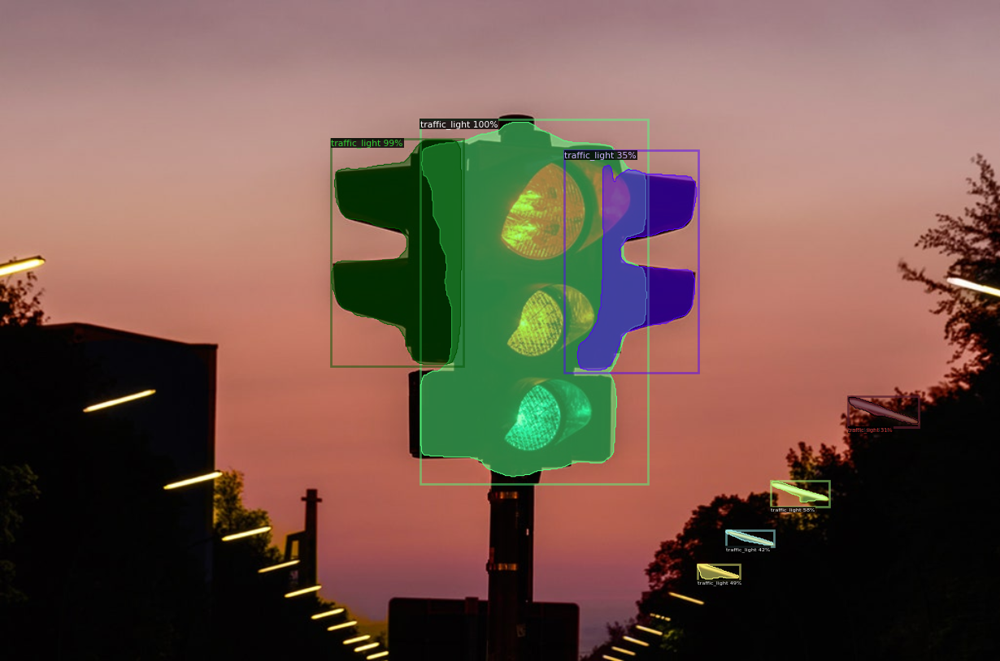

In [36]:
import cv2
im = cv2.imread('/content/trafficlight-inline.jpg')

predictor = DefaultPredictor(cfg)
outputs = predictor(im)

# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [26]:
!wget https://www.betterteam.com/images/what-is-people-operations-2400x2400-20201118.jpg

--2021-08-19 11:48:53--  https://www.betterteam.com/images/what-is-people-operations-2400x2400-20201118.jpg
Resolving www.betterteam.com (www.betterteam.com)... 151.101.2.133, 151.101.66.133, 151.101.130.133, ...
Connecting to www.betterteam.com (www.betterteam.com)|151.101.2.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244836 (239K) [image/jpeg]
Saving to: ‘what-is-people-operations-2400x2400-20201118.jpg’

what-is-people-oper 100%[===================>] 239.10K  --.-KB/s    in 0.01s   

2021-08-19 11:48:53 (20.8 MB/s) - ‘what-is-people-operations-2400x2400-20201118.jpg’ saved [244836/244836]



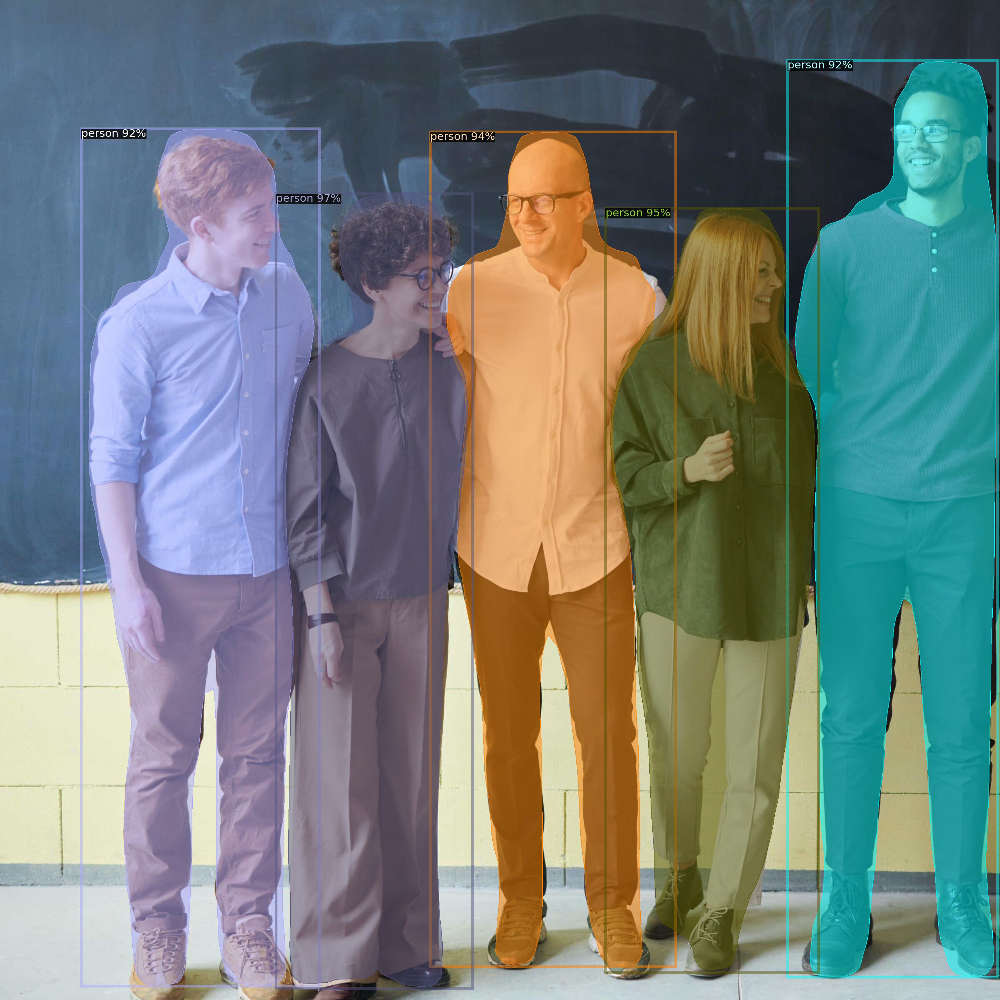

In [37]:
import cv2
im = cv2.imread('/content/what-is-people-operations-2400x2400-20201118.jpg')

predictor = DefaultPredictor(cfg)
outputs = predictor(im)

# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [28]:
!wget https://hips.hearstapps.com/cosmouk.cdnds.net/16/24/980x615/gallery-1465802419-woman-in-messy-bedroom.jpg

--2021-08-19 11:49:53--  https://hips.hearstapps.com/cosmouk.cdnds.net/16/24/980x615/gallery-1465802419-woman-in-messy-bedroom.jpg
Resolving hips.hearstapps.com (hips.hearstapps.com)... 151.101.0.155, 151.101.64.155, 151.101.128.155, ...
Connecting to hips.hearstapps.com (hips.hearstapps.com)|151.101.0.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 122804 (120K) [image/jpeg]
Saving to: ‘gallery-1465802419-woman-in-messy-bedroom.jpg’

gallery-1465802419- 100%[===================>] 119.93K  --.-KB/s    in 0.008s  

2021-08-19 11:49:53 (13.8 MB/s) - ‘gallery-1465802419-woman-in-messy-bedroom.jpg’ saved [122804/122804]



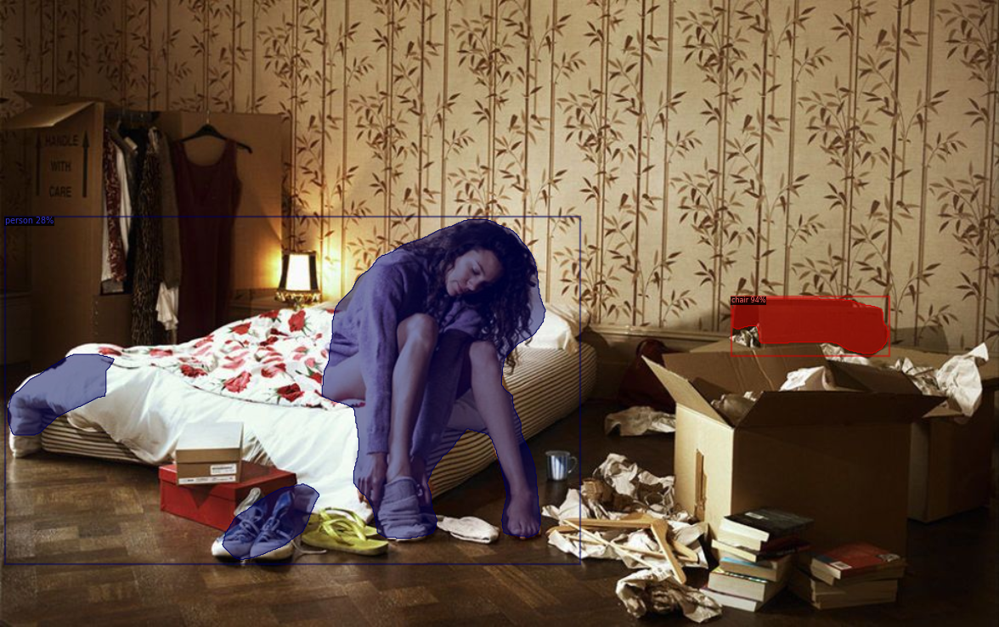

In [38]:
import cv2
im = cv2.imread('/content/gallery-1465802419-woman-in-messy-bedroom.jpg')

predictor = DefaultPredictor(cfg)
outputs = predictor(im)

# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [30]:
!wget https://thumbs.dreamstime.com/b/young-blind-man-white-cane-guide-dog-walking-across-street-city-side-view-164225895.jpg

--2021-08-19 11:50:50--  https://thumbs.dreamstime.com/b/young-blind-man-white-cane-guide-dog-walking-across-street-city-side-view-164225895.jpg
Resolving thumbs.dreamstime.com (thumbs.dreamstime.com)... 192.229.233.122
Connecting to thumbs.dreamstime.com (thumbs.dreamstime.com)|192.229.233.122|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 63967 (62K) [image/jpeg]
Saving to: ‘young-blind-man-white-cane-guide-dog-walking-across-street-city-side-view-164225895.jpg’

young-blind-man-whi 100%[===================>]  62.47K  --.-KB/s    in 0.005s  

2021-08-19 11:50:50 (12.7 MB/s) - ‘young-blind-man-white-cane-guide-dog-walking-across-street-city-side-view-164225895.jpg’ saved [63967/63967]



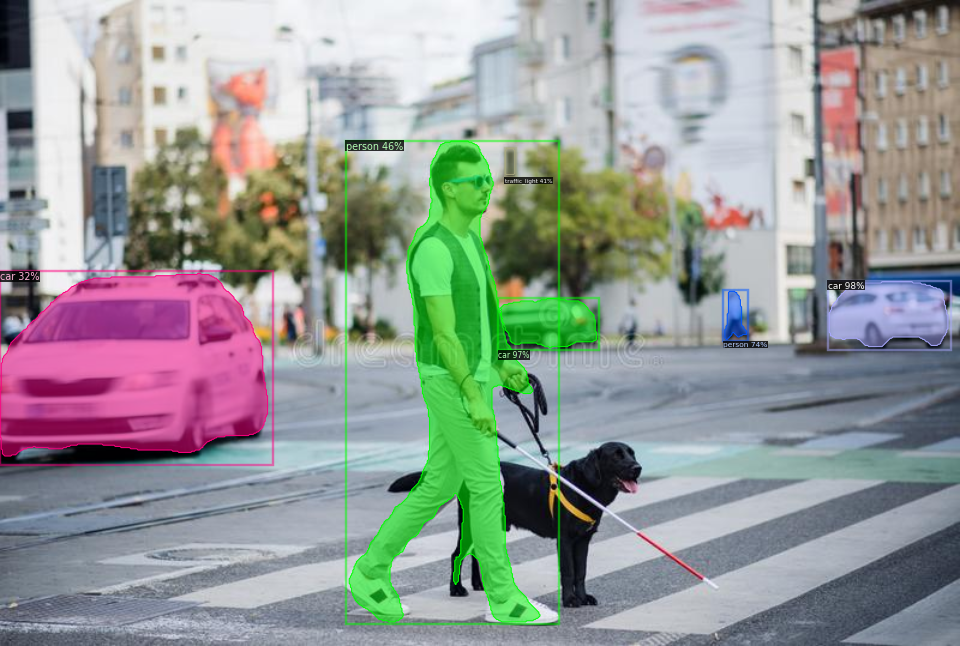

In [39]:
import cv2
im = cv2.imread('/content/young-blind-man-white-cane-guide-dog-walking-across-street-city-side-view-164225895.jpg')

predictor = DefaultPredictor(cfg)
outputs = predictor(im)

# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])